In [1]:
import os
import cv2
import matplotlib.pyplot as plt

dataset_testval = r'synthetic_data\testval'
dataset_train = r'synthetic_data\train'
image_testval = os.path.join(dataset_testval, 'images')
label_testval = os.path.join(dataset_testval, 'labels')
image_train = os.path.join(dataset_train, 'images')
label_train = os.path.join(dataset_train, 'labels')

print(image_testval)
print(label_testval)
print(image_train)
print(label_train)

synthetic_data\testval\images
synthetic_data\testval\labels
synthetic_data\train\images
synthetic_data\train\labels


In [2]:
def draw_bbox(image_path, label_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Failed to load image: {image_path}")
        return None

    h, w = img.shape[:2]

    if not os.path.exists(label_path):
        print(f"Label file not found: {label_path}")
        return img

    with open(label_path, 'r') as f:
        line = f.readline()
        parts = line.strip().split()
        if len(parts) < 5:
            print(f"Invalid label format in {label_path}")
            return img

        class_id, x_center, y_center, width, height = map(float, parts)
        x_center, y_center, width, height = x_center * w, y_center * h, width * w, height * h

        x1 = int(x_center - width / 2)
        y1 = int(y_center - height / 2)
        x2 = int(x_center + width / 2)
        y2 = int(y_center + height / 2)

        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f"Plate", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    
    return img

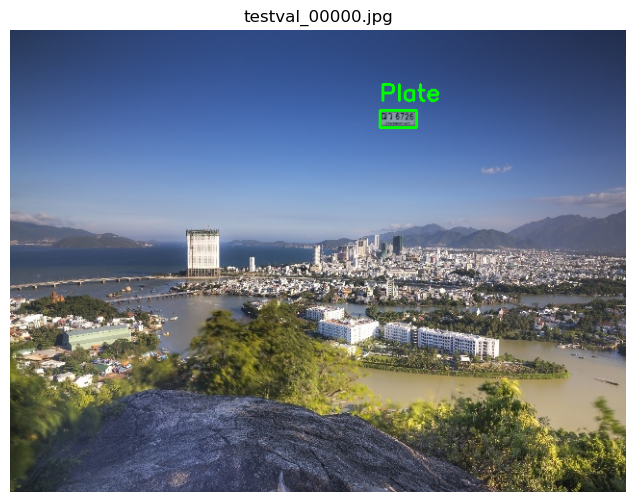

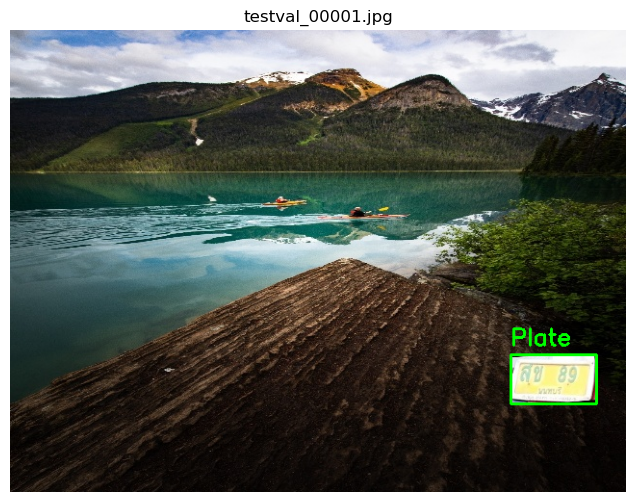

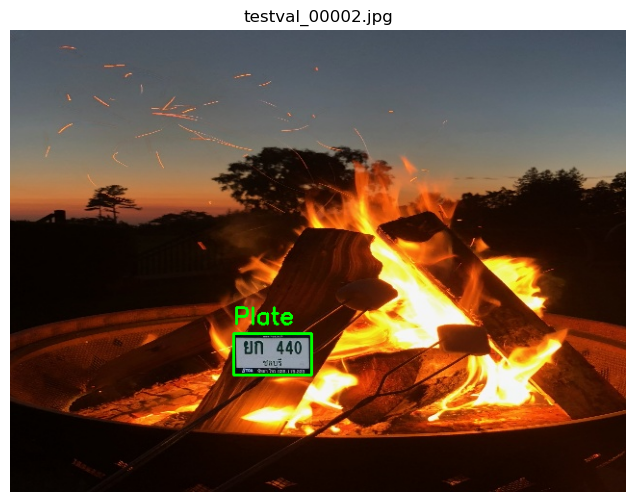

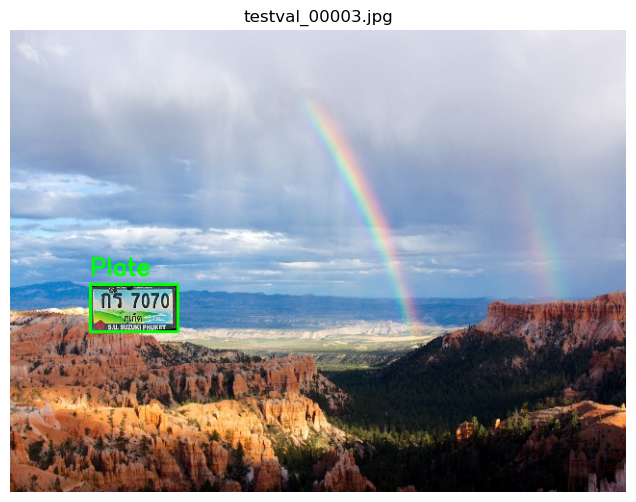

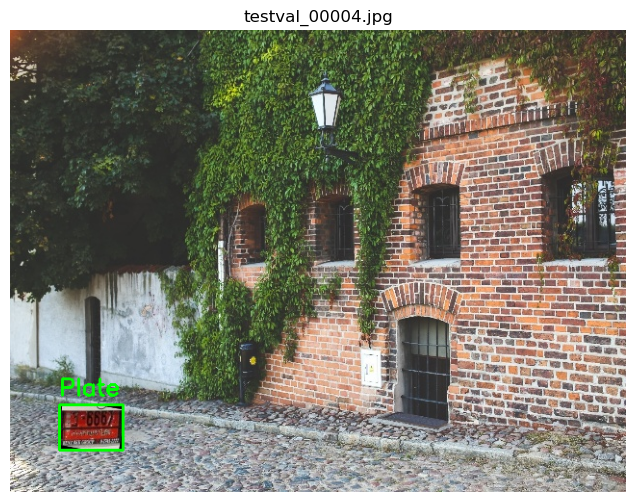

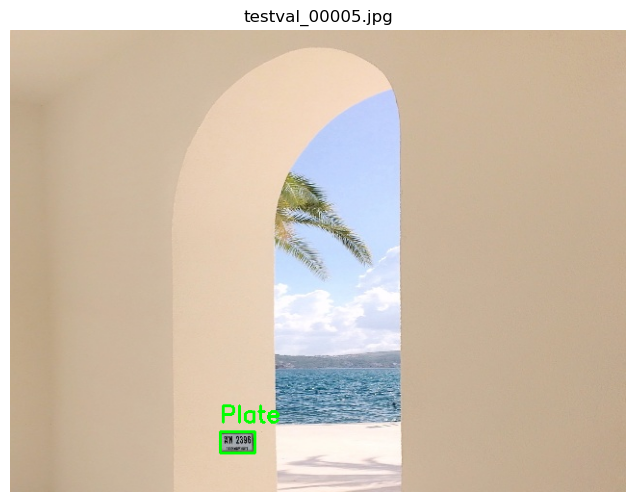

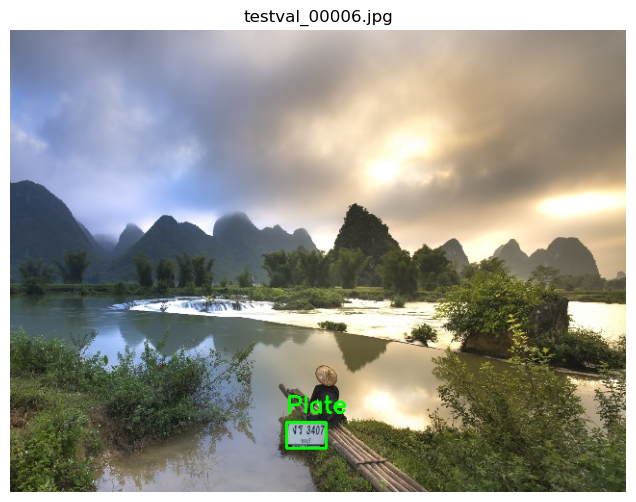

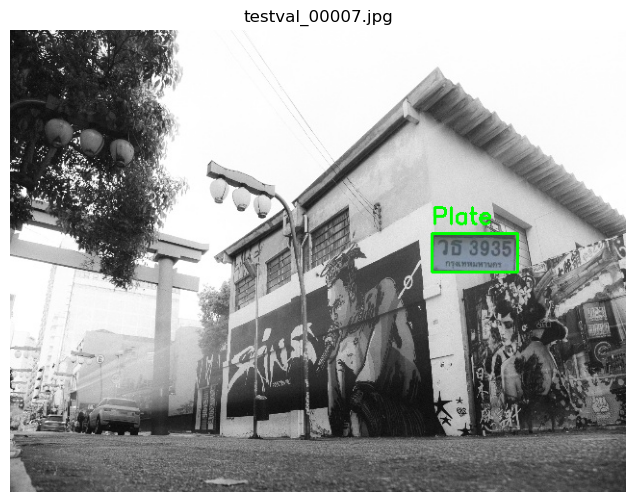

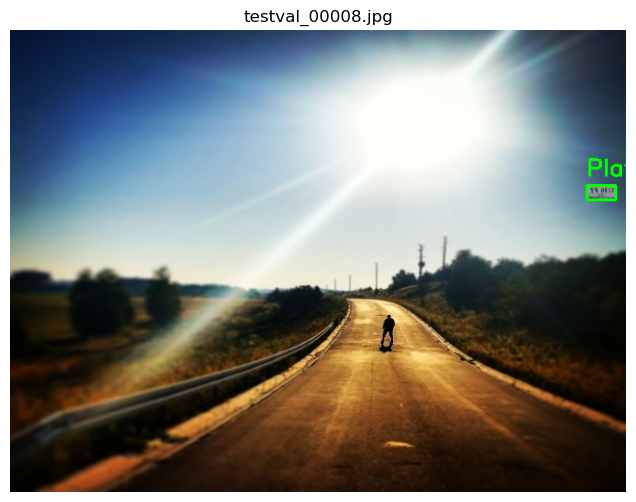

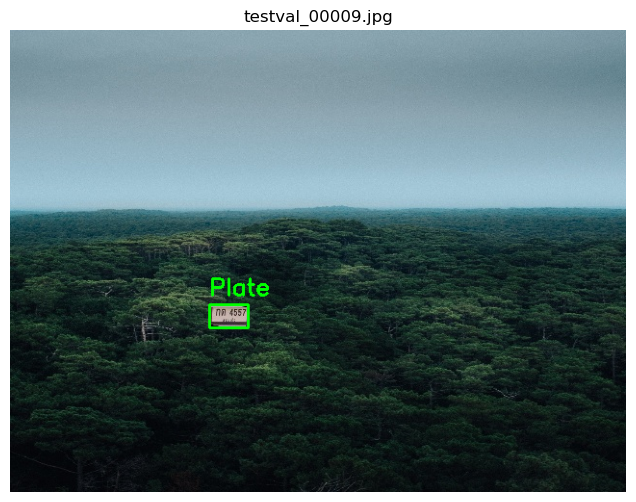

In [3]:
valid_exts = ['.jpg', '.jpeg', '.png']
sample_images = [f for f in os.listdir(image_testval) if os.path.splitext(f)[1].lower() in valid_exts]
sample_images = sample_images[:10]

for img_name in sample_images:
    img_path = os.path.join(image_testval, img_name)
    label_path = os.path.join(label_testval, os.path.splitext(img_name)[0] + '.txt')
    img_with_bbox = draw_bbox(img_path, label_path)
    
    if img_with_bbox is not None:
        plt.figure(figsize=(8, 6))
        plt.imshow(cv2.cvtColor(img_with_bbox, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()

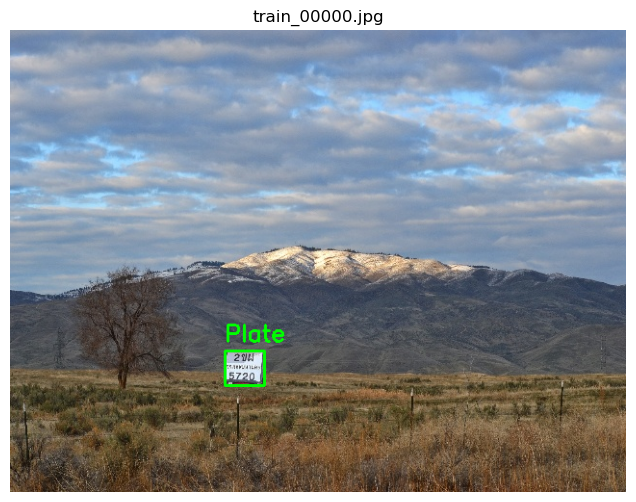

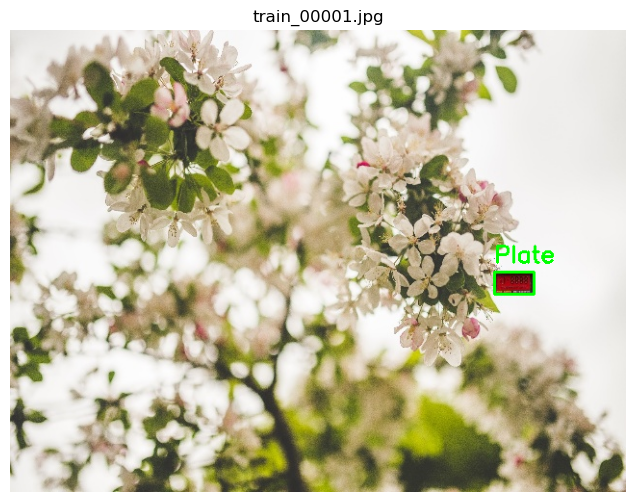

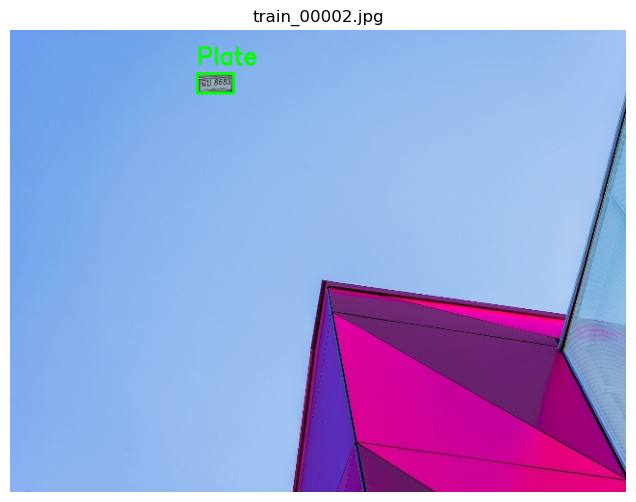

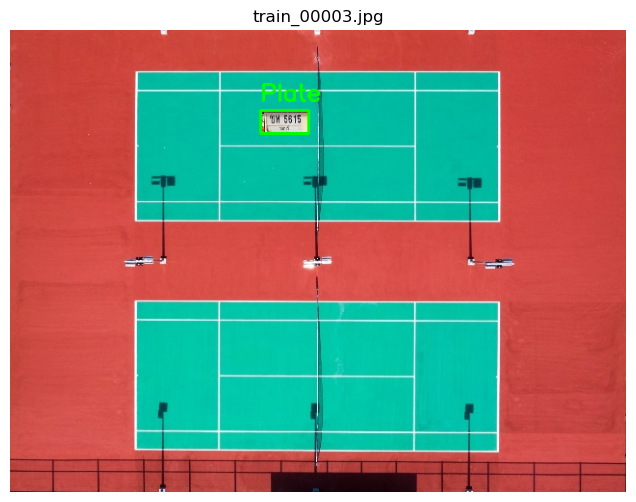

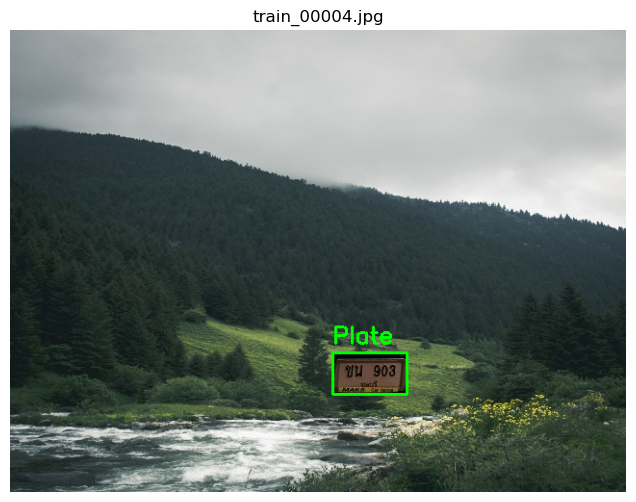

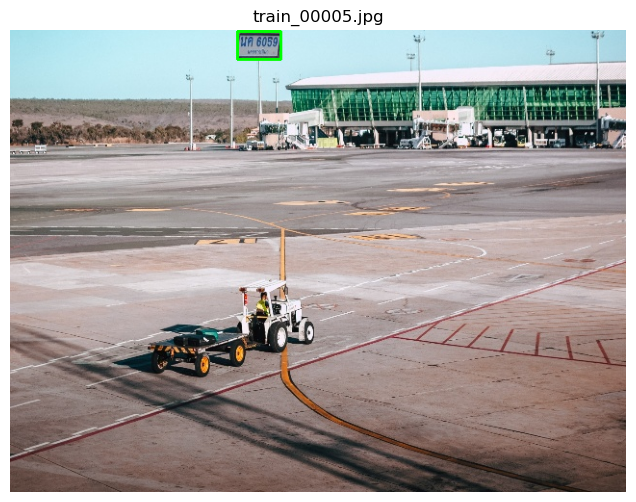

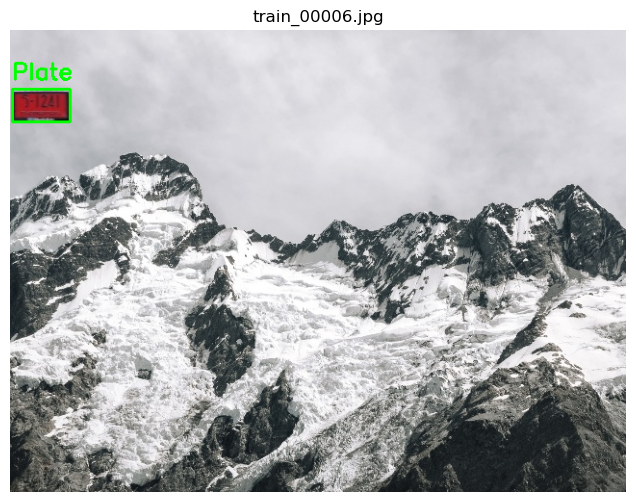

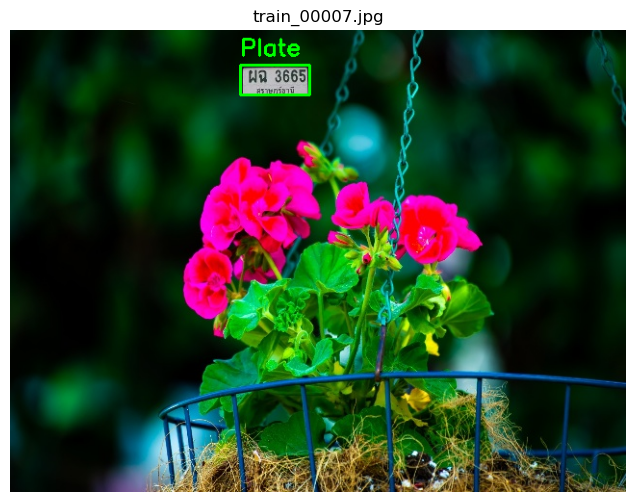

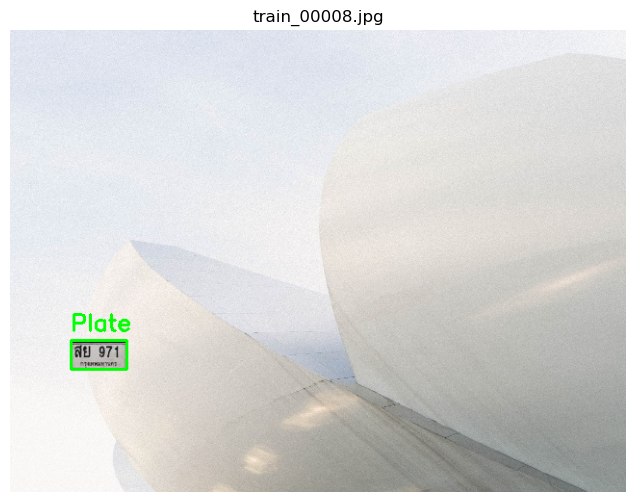

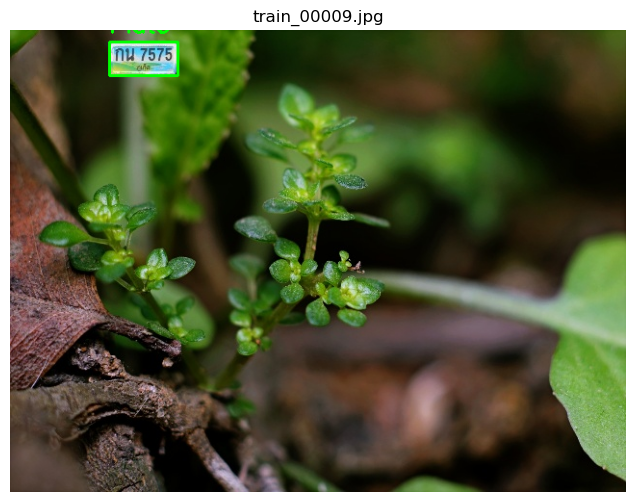

In [4]:
valid_exts = ['.jpg', '.jpeg', '.png']
sample_images = [f for f in os.listdir(image_train) if os.path.splitext(f)[1].lower() in valid_exts]
sample_images = sample_images[:10]

for img_name in sample_images:
    img_path = os.path.join(image_train, img_name)
    label_path = os.path.join(label_train, os.path.splitext(img_name)[0] + '.txt')
    img_with_bbox = draw_bbox(img_path, label_path)
    
    if img_with_bbox is not None:
        plt.figure(figsize=(8, 6))
        plt.imshow(cv2.cvtColor(img_with_bbox, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()